In [32]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import PIL

In [35]:
#Helper Functions

def display_image(tensor,index=0):
    plt.imshow(tensor[index])

def convert_to_tensor(path,shape=(512,512,3)):
    """
    Converts image into a tf.Tensor object.\n\n

    Arguments:\n
    path -- Path to the image in the directory.\n
    shape -- Dimensions of the image (length and width).\n

    Returns:\n
    tensor -- Tensor of shape (1,shape,3) with float 32 values.\n

    """
    image = np.array(PIL.Image.open(path).resize(shape))
    image = tf.constant(np.reshape(image, ((1,)+image.shape)))
    return image

def preprocess_image(image):
    preprocessed_image = tf.Variable(tf.image.convert_image_dtype(image,tf.float32))
    return preprocessed_image

def random_noise_generator(image,minval=-0.25,maxval=0.25,intensity=1):
    """
    Adds noise to images (tf.Tensor) or generates image with noise from the normal distribution. \n\n

    Arguments: \n
    image -- tf.Tensor object representing the image.\n
    stddev -- Standard deviation of the distribution.\n
    mean -- Mean of the distribution.\n
    instensity -- A weight multiplied to the noise.\n\n
    
    Returns:\n
    noise -- A tf.Tensor representing the image with random noise.\n
    OR\n
    noisy_image -- A tf.Tensor representing the image with random noise added to it.\n
    """
    tensor = tf.image.convert_image_dtype(image,tf.float32)
    noise = tf.random.uniform(tensor.shape,minval,maxval)
    noisy_image = tf.add(tensor,tf.multiply(intensity,noise))
    noisy_image = tf.clip_by_value(noisy_image, clip_value_min=0.0, clip_value_max=1.0)
    return noisy_image


In [36]:
def convert_to_image(tensor):
    """
    Converts the given tensor into a PIL image
    
    Arguments:
    tensor -- Tensor
    
    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

In [37]:
def compute_content_loss(a_O,a_G):
    """
    Computes the content loss for a content image and a generated image.\n\n

    Arguments:\n
    a_O -- List of the content tf.Tensor's of shape (1,n_H,n_W,n_C).\n
    a_G -- List of the generated tf.Tensor's of shape (1,n_H,n_W,n_C).\n\n

    Returns:\n
    L_content -- Total content loss.
    """

    #Extract 3D array instead of the 4D one.
    a_O = a_O[-1]
    a_G = a_G[-1]

    #Extract dimensions
    _, n_H, n_W, n_C = a_O.shape

    #Compute cost.
    cost = (1.0/(4.0*(n_H*n_W*n_C)*(n_H*n_W*n_C)))*0.5*tf.square(tf.subtract(a_G,a_O))

    #Compute total loss
    L_content = tf.reduce_sum(cost)

    return L_content

In [38]:
def gram_matrix(tensor):
    """ 
    Shrinks dimension of tensor to 3D and computes the gram matrix.\n\n

    Arguments:\n
    tensor -- tf.Tensor of shape (1,n_H,n_W,n_C).\n\n

    Returns:
    gram -- Gram matrix of shape (n_H*n_W,n_C).\n
    """
    #Extracting 3D array from a 4D one.
    tensor = tensor[-1]

    #Get shape of the feature map.
    n_H, n_W, n_C = tensor.shape

    #Unrolling the tensor into 2D matrix.
    tensor_unrolled = tf.reshape(tensor,shape=[n_H*n_W,n_C])

    #Computing gram matrix.
    gram = tf.matmul(tf.transpose(tensor_unrolled),tensor_unrolled)
    
    return gram

In [39]:
def compute_layer_style_loss(a_S,a_G):
    """ 
    Computes style loss of feature maps produced by a certain layer.

    Arguments:\n
    a_S -- The style tf.Tensor of shape (1,n_H,n_W,n_C).\n
    a_G -- The generated tf.Tensor of shape (1,n_H,n_W,n_C).\n\n

    Returns:
    layer_loss -- Stlye loss of the layer.
    """

    #Extracting dimensions of tensors
    n_H, n_W, n_C = a_S[-1].shape
    
    #Gram matrix of generated image feature map.
    generated_gram = gram_matrix(a_G)

    #Gram matrix of style image feature map.
    style_gram = gram_matrix(a_S)

    #Layer cost
    layer_cost = (1.0/(4.0*(n_H*n_W*n_C)*(n_H*n_W*n_C)))*tf.square(tf.subtract(generated_gram,style_gram))

    #Layer loss
    layer_loss = tf.reduce_sum(layer_cost)
    
    return layer_loss

In [40]:
def compute_style_loss(layer_outputs_generated,layer_outputs_style,w):
    """ 
    Computes total loss of all the layers.\n\n

    Arguments:\n
    layer_outputs_generated -- List of feature maps of the generated image.\n
    layer_outputs_style -- List of feature maps of the style image.\n
    w -- Weight added to each layer loss.\n\n

    Returns:
    L_style -- Total style loss of all the layers.\n
    """
    
    #Initiating variable for total loss of all the layers.
    L_style = 0.0

    #The last layer output in the string is the content representation
    a_S = layer_outputs_style[:-1]
    a_G = layer_outputs_generated[:-1]

    #Iterating through the loop of a list of layer outputs of generated and style image feature, multiplying them by w and adding them up.
    for i in range(len(a_G)):
        L_layer = compute_layer_style_loss(a_S[i],a_G[i])
        L_style += w*L_layer

    return L_style


In [41]:
def compute_total_loss(L_content,L_style,alpha=1e4,beta=1e-2):

    L = tf.add(alpha*L_content,beta*L_style)

    return L

In [42]:
STYLE_LAYERS = (
    'block1_conv1',
    'block2_conv1',
    'block3_conv1',
    'block4_conv1',
    'block5_conv1')

CONTENT_LAYER = (
    'block5_conv2',
)

In [43]:
def model_outputs(model,STYLE_LAYERS,CONTENT_LAYER):
    """ 
    Returns a model to compute feature maps at the desired layers.\n
    This model returns a list of feature maps (tf.Tensor) from the desired layers from the tuple arguments. The last tensor is the content map.\n\n

    Arguments:\n
    model -- A tf.keras.Model object whose layer outputs we want.\n
    STYLE_LAYER -- A tuple with the names of style layers.\n
    CONTENT_LAYER -- A tuple with the names of content layers.\n\n

    Returns:\n
    output_model -- Model to compute feature maps from the desired layers.\n
    """ 
    #Define a list which will contain the outputs of the layers from the tuples in the argument.
    outputs = []

    #Iterate through the STYLE_LAYERS and append them to the list.
    for layer in STYLE_LAYERS:
        outputs.append(model.get_layer(layer).output)
    
    #Iterate through the CONTENT_LAYERS and append them to the list.
    for layer in CONTENT_LAYER:
        outputs.append(model.get_layer(layer).output)

    #Define the model with its inputs and outputs
    output_model = tf.keras.Model(inputs = [model.input], outputs = outputs)

    return output_model

In [1]:
@tf.function()
def train_step(model,generated_image,encoded_style,encoded_content,optimizer,alpha=10,beta=400):

    with tf.GradientTape() as tape:

        tape.watch(generated_image)

        #Compute feature map generated image.
        a_G = model(generated_image)

        #Compute style loss.
        L_style = compute_style_loss(a_G,encoded_style,w=0.2)

        #Compute content loss.
        L_content = compute_content_loss(encoded_content,a_G)

        #Compute total loss.
        L = compute_total_loss(L_content,L_style,alpha,beta)
    
    #Calculate gradients.
    grad = tape.gradient(L,generated_image)

    #Optimise image.
    optimizer.apply_gradients([(grad,generated_image)])

    #Clip the values over 1 and lesser than 0 in the tensor.
    generated_image = tf.clip_by_value(generated_image,0,1)

    return generated_image,grad
    

NameError: name 'tf' is not defined

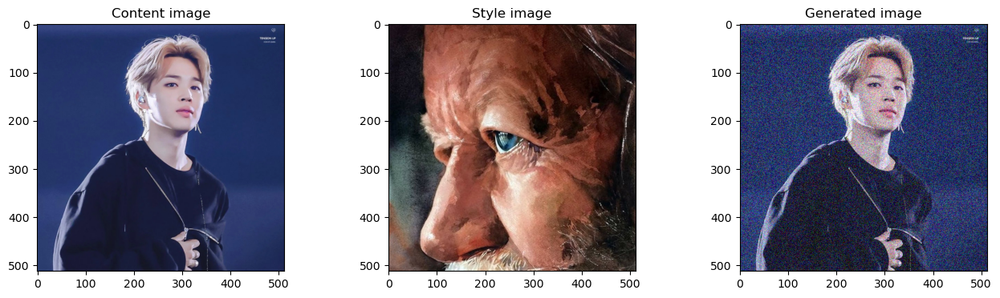

In [46]:
content_image = convert_to_tensor(path='Jimin_Content.jpeg',shape = (512,512))
style_image = convert_to_tensor(path='Portrait_Style.jpeg',shape =(512,512))
generated_image = random_noise_generator(content_image)



In [47]:
content_image = preprocess_image(content_image)
style_image = preprocess_image(style_image)

In [48]:
generated_image = tf.Variable(generated_image)

In [49]:
vgg19 = tf.keras.applications.vgg19.VGG19(include_top=False,input_shape=[512,512,3])
vgg_model_outputs = model_outputs(vgg19,STYLE_LAYERS=STYLE_LAYERS,CONTENT_LAYER=CONTENT_LAYER)

In [50]:
content_encoded = vgg_model_outputs(content_image)
style_encoded = vgg_model_outputs(style_image)

2023-07-29 15:56:12.682779: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Epoch: 0


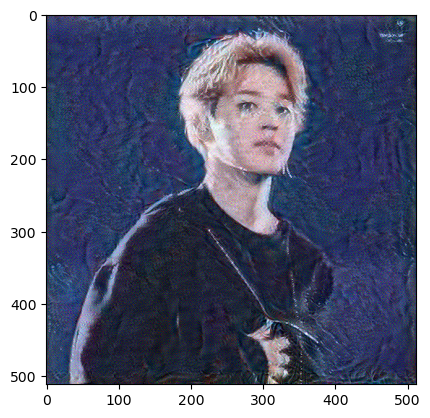

Epoch: 50


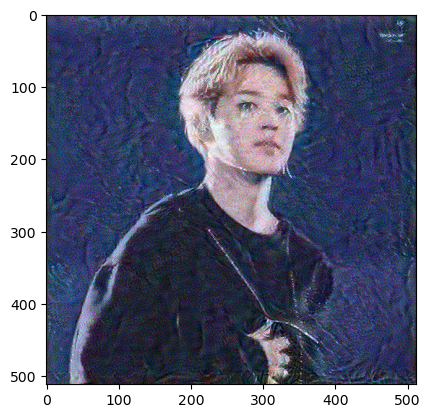

Epoch: 100


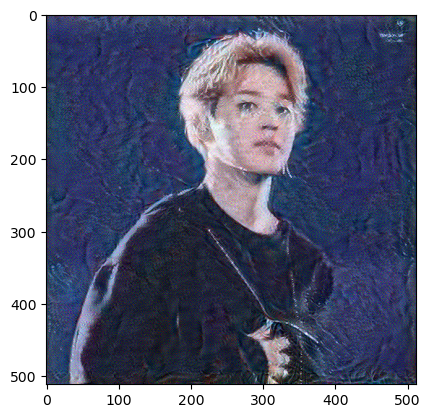

Epoch: 150


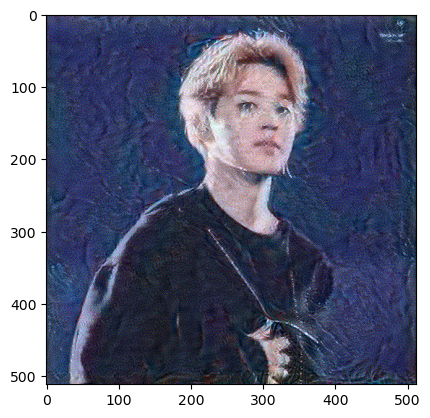

Epoch: 200


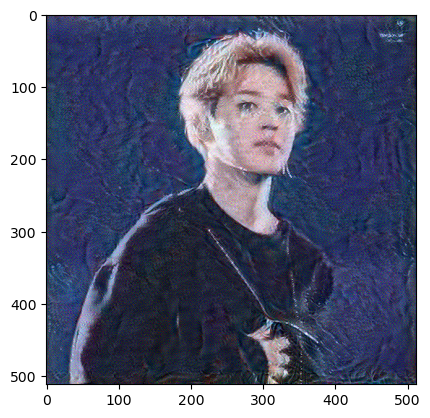

Epoch: 250


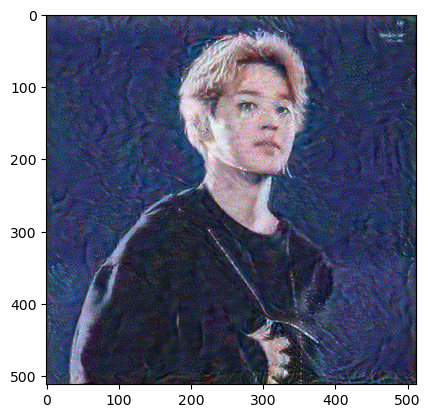

Epoch: 300


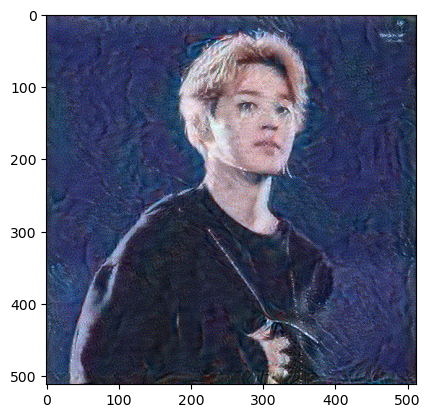

Epoch: 350


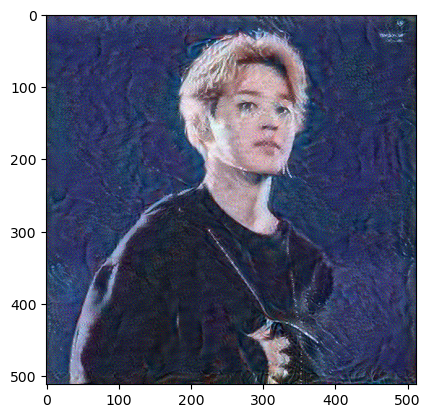

Epoch: 400


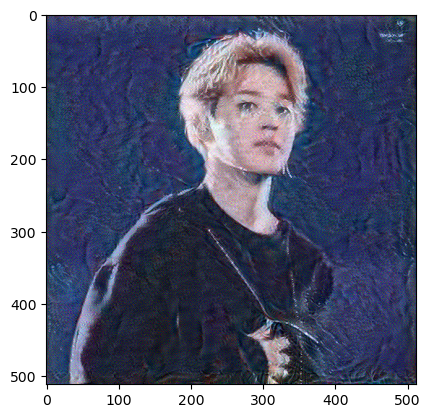

Epoch: 450


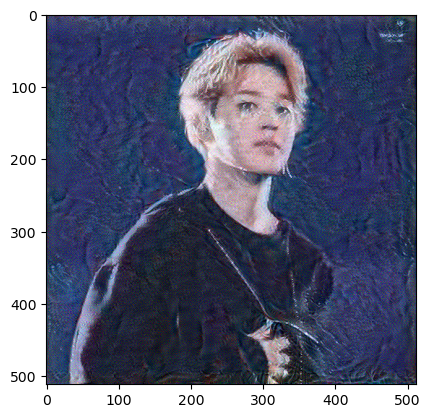

Epoch: 500


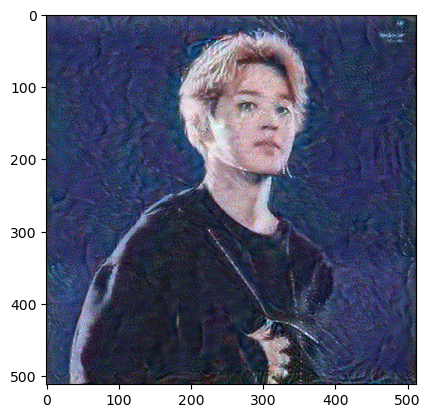

Epoch: 550


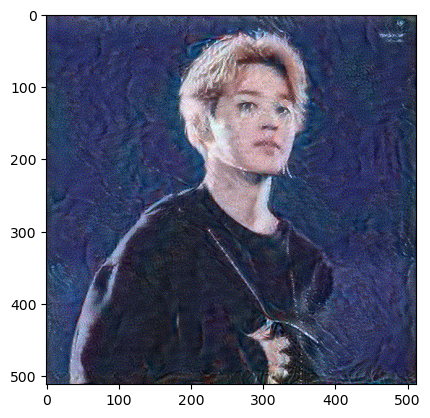

Epoch: 600


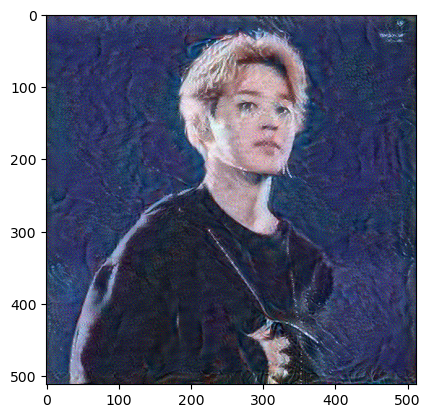

Epoch: 650


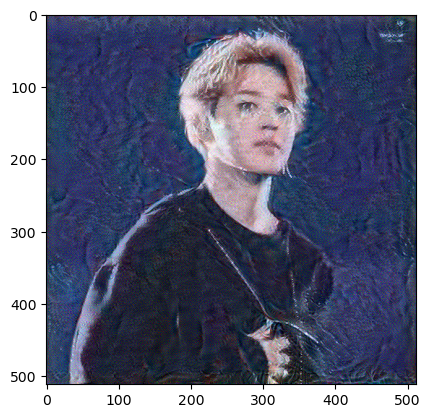

Epoch: 700


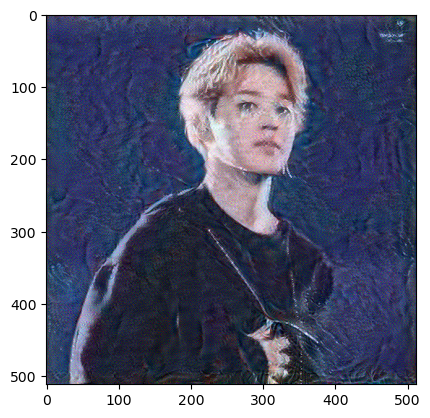

Epoch: 750


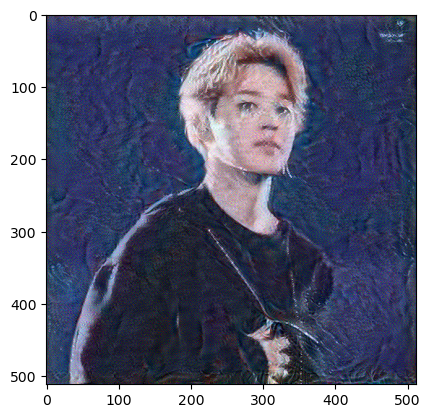

Epoch: 800


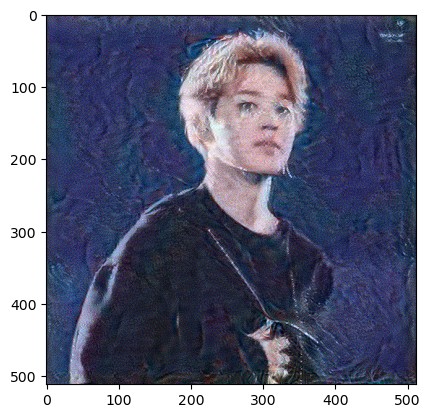

Epoch: 850


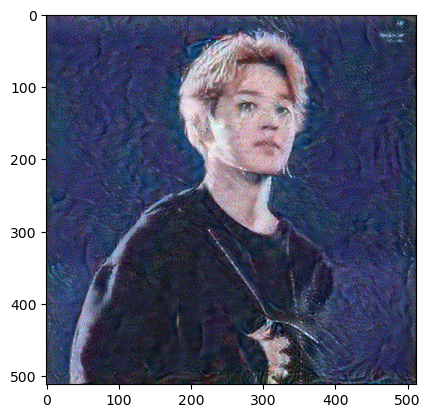

Epoch: 900


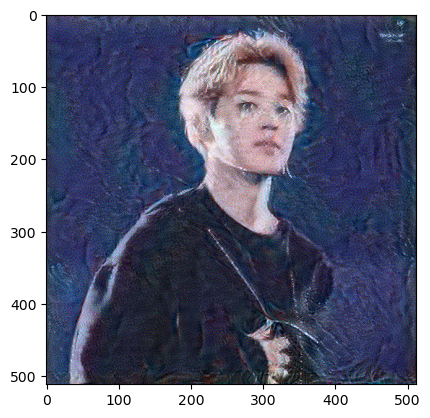

Epoch: 950


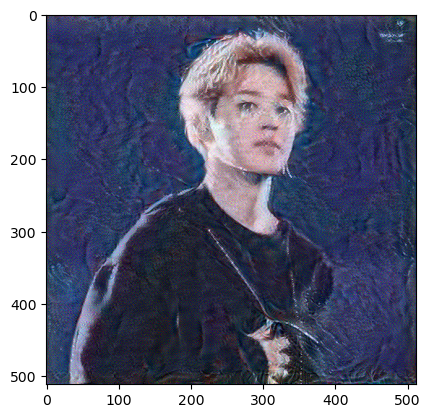

Epoch: 1000


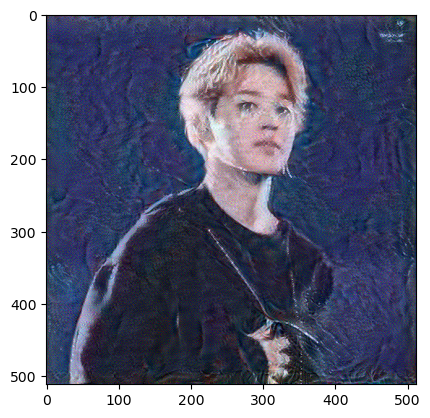

Epoch: 1050


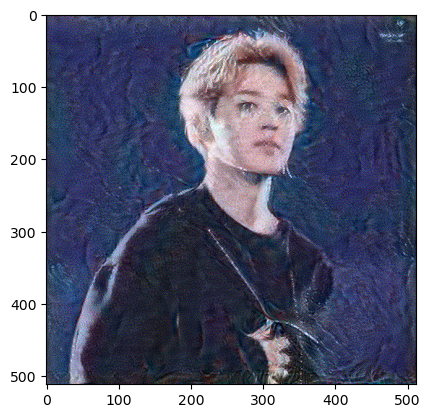

Epoch: 1100


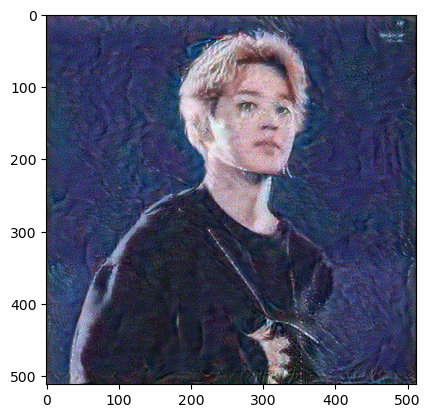

Epoch: 1150


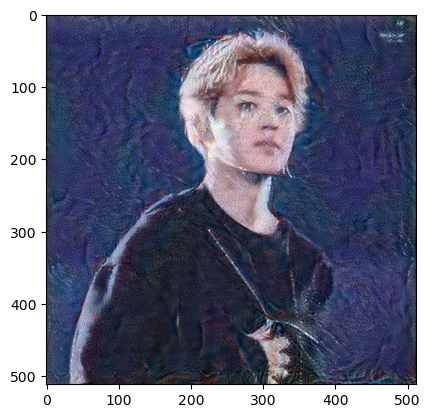

Epoch: 1200


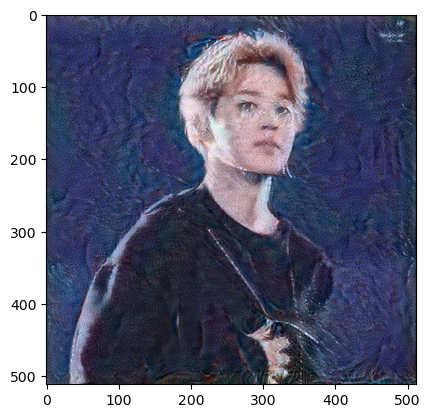

Epoch: 1250


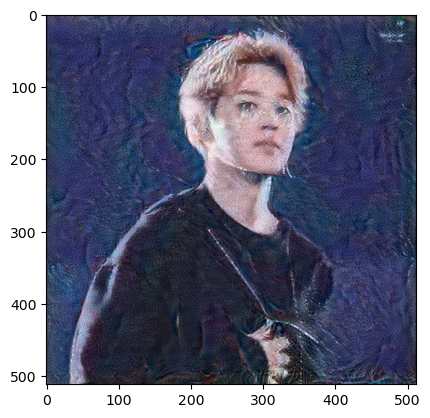

Epoch: 1300


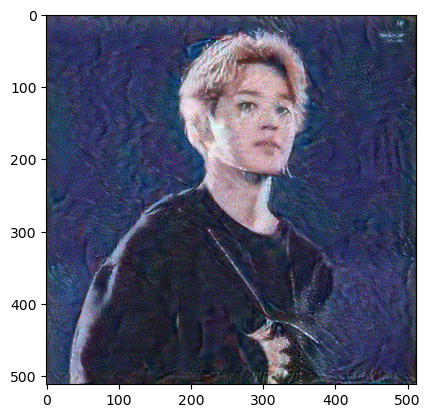

Epoch: 1350


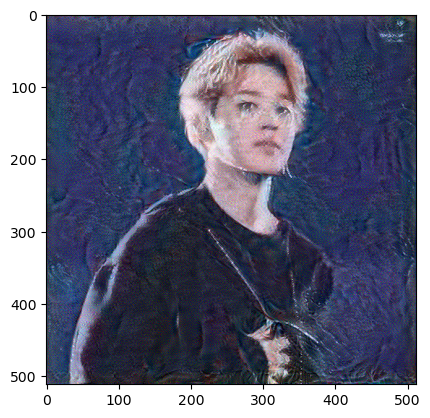

Epoch: 1400


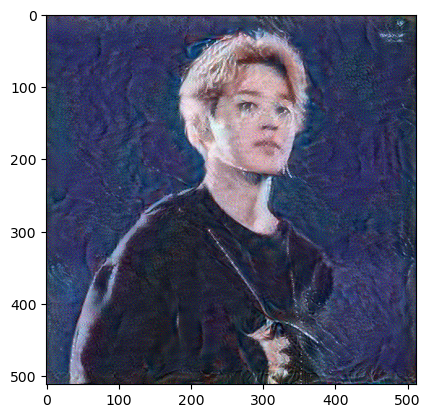

Epoch: 1450


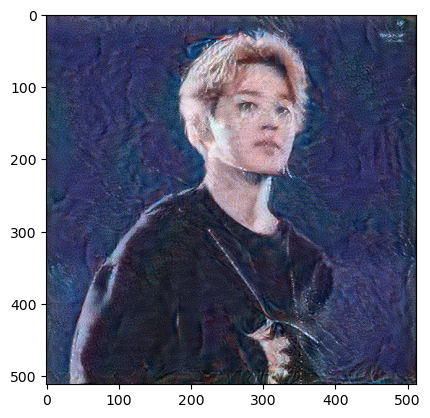

Epoch: 1500


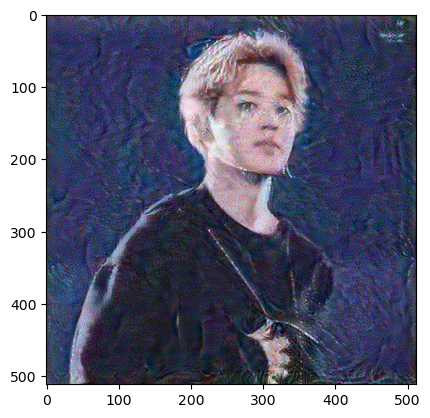

In [57]:
epochs = 1500
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.001,beta_1=0.99)
print_every = 50
path = 'Generated_Jimin_2500.jpeg'

for i in range(epochs+1):
    generated_image,l = train_step(model = vgg_model_outputs,
                                 generated_image = generated_image, 
                                 encoded_style = style_encoded,
                                 encoded_content = content_encoded,
                                 optimizer = optimizer)
    
    generated_image = tf.Variable(generated_image)
    
    if i%print_every == 0:
        print(f"Epoch: {i}")
        image = convert_to_image(generated_image)
        plt.imshow(image)
        plt.show()

image = convert_to_image(generated_image)
image.save(path)
                                 

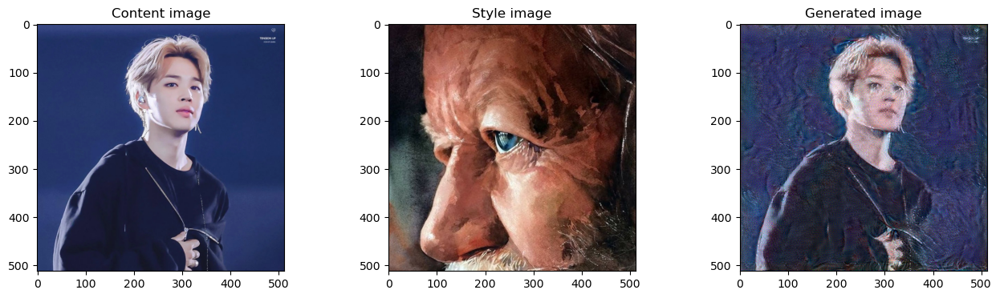

In [58]:
# Show the 3 images in a row
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
plt.imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
plt.imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
plt.imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()

In [ ]:
Adam = tf.keras.optimizers.Adam(learning_rate=0.001)
def generate(content_path,style_path,save_path,output_model,optimizer = Adam, epochs = 250,print_every=10,alpha = 0.0001,beta=1.0):

    content_image = convert_to_tensor(path=content_path,shape=[512,512])
    print("Content:")
    display_image(content_image)
    style_image = convert_to_tensor(path=style_path,shape=[512,512])
    print("Style:")
    display_image(style_image)
    generated_image = random_noise_generator(content_image)

    print("Generating ...")
    content_encoded = output_model(content_image)
    style_encoded = output_model(style_image)
    
    for i in range(epochs+1):

        generated_image,l = train_step(output_model,generated_image,style_encoded,content_encoded,Adam,alpha,beta)

        if i%10 == 0:
            print("Epoch: ")
            display_image(generated_image)

    convert_to_image(generated_image,path=save_path)

In [ ]:
model,output_model = compile_model('vgg19.h5',STYLE_LAYERS,CONTENT_LAYER)

In [ ]:
vgg19 = tf.keras.applications.vgg19.VGG19(include_top=False,input_shape=[512,512,3])

In [ ]:
vgg19_outputs = model_outputs(vgg19,STYLE_LAYERS,CONTENT_LAYER)

In [ ]:
generate('BITS_content.jpeg','Van_Gogh_Style_Image.jpeg','Stylised',vgg19_outputs,epochs=10,print_every=1)

In [ ]:
vgg19.summary()